<a href="https://colab.research.google.com/github/jojozyang/CCM-site/blob/master/Behavior_analysis_after_a_task_ends.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>Analysis on animal behavior after a spatial alternation task </center>
## <center>by Zhuonan (Jojo) Yang</center>

# Set up

In [ ]:
#@title Initial load {display-mode: "form"}
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [ ]:
#@title Load libraries and data {display-mode: "form"}


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import ast
import datetime
import math
from scipy.signal import filtfilt as filtfilt
from statistics import mode
from scipy.stats import ranksums as ranksum
from statistics import mean
from statistics import median
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
sns.set_palette(sns.color_palette("Accent"))
from scipy.stats import sem as sem
from numpy import array, sqrt
from numpy.random import binomial as binom
from scipy.stats import wilcoxon as wixon
import cv2
from IPython.display import HTML
import networkx as nx
from scipy.stats import shapiro
from random import randint
from scipy.stats import iqr
pd.options.display.max_rows = 120
from base64 import b64encode

My_palette = ["#75D17F", "#FFBB3C", "#C6AF90", "#CC9CE7", "#9DBDF5", "#F289F4"]
sns.set_palette(sns.color_palette(My_palette))

path_ANB_NearWell = "/content/drive/My Drive/Data_Decision_Making/ANB_NearWell.csv"
df_SessionTable = pd.read_csv(path_ANB_NearWell)
path_AnimalInfo = "/content/drive/My Drive/Data_Decision_Making/AnimalInfo.csv"
AnimalInfo = pd.read_csv(path_AnimalInfo)
path_df_ANB_NearWell_Summary= '/content/drive/My Drive/Data_Decision_Making/df_ANB_NearWell_Summary.csv'
df_ANB_NearWell_Summary = pd.read_csv(path_df_ANB_NearWell_Summary)
path_df_AllSesTable = '/content/drive/My Drive/Data_Decision_Making/df_AllSesTable.csv'
df_AllSesTable = pd.read_csv(path_df_AllSesTable)
path_df_DiffSumInfo = '/content/drive/My Drive/Data_Decision_Making/df_DiffSumInfo_new.csv'
df_DiffSumInfo = pd.read_csv(path_df_DiffSumInfo)
path_df_IndiAniStats_ranksum= '/content/drive/My Drive/Data_Decision_Making/df_IndiAniStats_ranksum.csv'
df_IndiAniStats_ranksum = pd.read_csv(path_df_IndiAniStats_ranksum)

df_SesInfo = pd.merge(df_SessionTable,AnimalInfo)
df_AllSesInfo = pd.merge(df_AllSesTable,AnimalInfo)
df_SumInfo = pd.merge(df_ANB_NearWell_Summary,AnimalInfo)

animal_ID = list(range(40))
coh3_animal_ID = list(range(15))
coh4_animal_ID = list(range(15,len(animal_ID)))

df = AnimalInfo
df_con = df.query('animal_operation == "control"')
control_animal = list(df_con['animal_ID'])

df_le= df.query('animal_operation == "lesion"')
lesion_animal= list(df_le['animal_ID'])

In [ ]:
#@title Load functions {display-mode: "form"}

def plot_shapiro(value,LogOrRaw):
    # internal helper
    def cal_shapiro(x):
        y = list(x[value])
        if len(y)>=3:
            if LogOrRaw == 'log':
                y= np.log(y)
            w,p=shapiro(y)
        else:
            p =np.nan
        return p

    if value == 'time':
        feature = 'time'
        unit='sec'
    else:
        feature = 'distance'
        unit='cm'
    df = df_SesInfo.query('StartPos_dis !=2')
    shaprio = df.groupby(['animal_ID','contingency','StartPos_dis']).apply(cal_shapiro)
    df_shaprio = pd.DataFrame(shaprio,columns= ['shaprio_p'])
    df_shaprio = df_shaprio.reset_index()
    df_shaprio = pd.merge(df_shaprio,AnimalInfo)

    g=sns.catplot(x='contingency',order = ['Before_NoCenter','NoCenter','After_NoCenter']
                ,y='shaprio_p', palette=My_palette,
                 col='StartPos_dis',
    data=df_shaprio)
    plt.subplots_adjust(top=0.8)
    g.fig.suptitle(feature,fontsize=20)
    ax = g.axes
    ax[0,0].set_title('close', fontsize=15)
    ax[0,1].set_title('medium', fontsize=15)
    ax[0,0].set_ylabel('p value', fontsize=15)
    for col in range(2):
        ax[0,col].axhline(y=0.05,c='red')
        ax[0,col].set_xlabel('')
        ax[0,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'], fontsize=13.6)
    plt.subplots_adjust(top=0.8)
    return df_shaprio

def plot_IndiAni_ranksum(item,animal_type):
    if item == 'time':
        feature = 'time'
        unit='sec'
    else:
        feature = 'distance'
        unit='cm'
    plt.style.use('seaborn')
    dis_list=['close','medium','far']
    sns.set_palette(sns.color_palette("Accent"),n_colors = 8)
    plt.figure(figsize=(20,6))
    plt.suptitle(feature,fontsize=20)
    for animal in animal_type:
        for dis in range(3):
            df = df_IndiAniStats_ranksum
            df = df.loc[(df['animal_ID']==animal) & (df['StartPos_dis']==dis)]
            pB = df[item+'_pB']
            pA = df[item+'_pA']
            plt.subplot(1,3,dis+1)
            plt.scatter([0+randint(0,10)/40],pB, c= '#C6AF90', alpha=0.8 )
            plt.scatter([1+randint(0,10)/40],pA ,c= '#CC9CE7',alpha=0.8 )
            plt.xticks([0,1],['early easy vs. hard tasks', 'late easy vs. hard tasks'],fontsize=13)
            plt.xlim(-0.4,1.4)
            plt.ylabel('p value',fontsize=15)
            plt.axhline(y=0.05, c='red')
            plt.ylim(-0.03,None)
            ytick = [0.0 , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
            plt.yticks(ytick,ytick)
            plt.title(dis_list[dis],fontsize=15)

# Introduction

In this notebook, I aim to tell a story of one of the problem solving experiences I had in science. Instead of describing every detail of the study, I included only the relevant information, aiming to highlight:

**1. How I think with data**

**2. How I visualize and communicate complex data**

**3. Some of the lessons I learned that would be very valuable in data science** <font color=#7B936F size=3> *(These will be colored with this green throughout the notebook)*</font>


# The scientific question

How do we make decisions? To be specific, how do daily experiences affect our subsequent decisions and behaviors? For example, if a promising business deal falls through, would we be more likely to make certain decisions (perhaps bad ones) than others? If so, how is this carried out by the brain?

Our first step was to operationalize this broad question by mapping it onto a specific experiment.
We designed an experiment where rats need to accomplish tasks of different difficulty levels. As you can imagine, the rats did not do very well at the harder tasks. Similar to a business deal falling through, we hypothesized that difficult tasks would lead rats to make different subsequent decisions. To test this, we analyzed the animals' behavior after the tasks were completed so that we could evaluate whether the difficulty level affected their subsequent decisions and behaviors.

<font color=#7B936F size=3>For me, the charm of data science is to use data to answer or provide insights to a meaninful question. I learned that it is critical to start with a big question and map it onto specific experiments. </font>


# The experimental system & visualization of animals' behavior

The experimental system is a novel automated system that is fully controlled by computer algorithms.

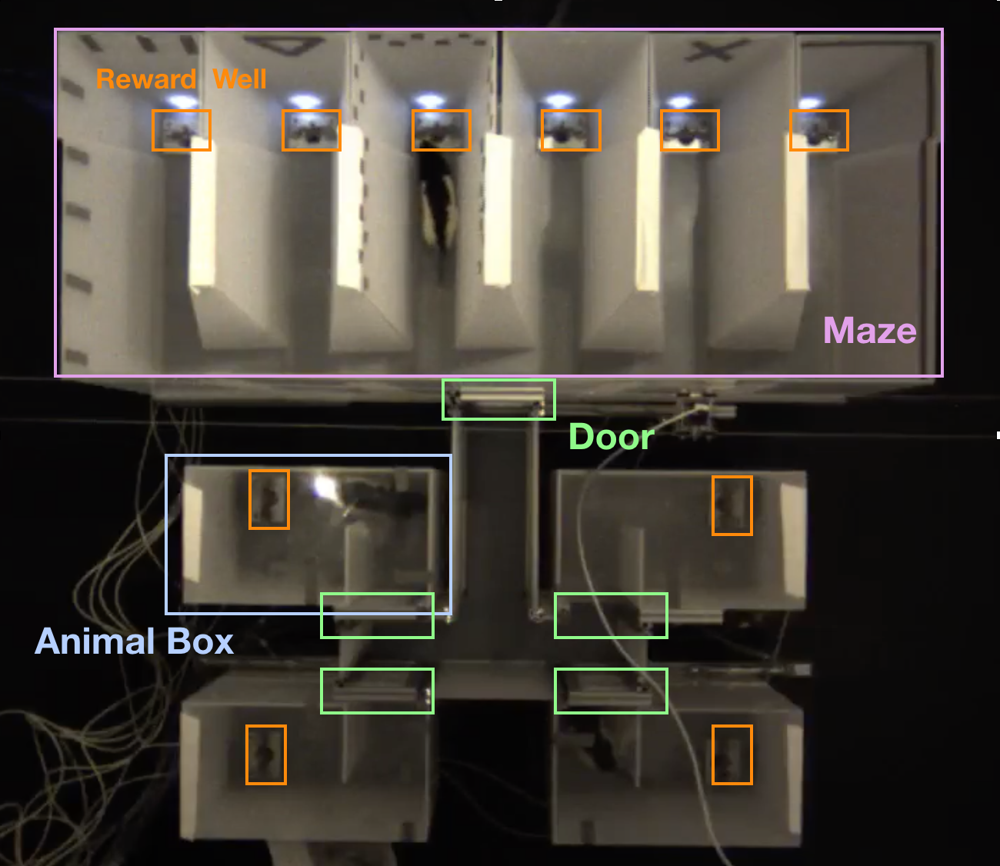

In [ ]:
#@title  {display-mode: "form"}
from IPython.display import Image
Image(filename="/content/drive/My Drive/Data_Decision_Making/track.png", width=450, height=400)

<font color=#F289F4>The maze area</font> is where animals first carry out tasks and then are allowed to freely explore the maze after they finish the tasks.  
    
<font color=#9DBDF5>Animal Boxes</font> are where animals rest when they are not engaging with the experiment.    
    
<font color=green>Doors</font> will automatically open and close in sequence according to our code wrriten to control the system.     
    
<font color=orange>Reward wells</font> will automatically deliver milk if animals correctly engage with the maze.</font>

Animals' behavior is recorded by a camera. Let's watch a video and see how our animals engage with with the system.   
In this video, the maze area is highlighted in green in our experimental system. The animal was tracked in the maze area throughout the video as denoted by the green circles around the animal.

In this accelerated video, one of the animals visited several reward wells in the maze. When the animal finished the task, the maze door automatically opened, which **presented the animal with the choice of continuing to explore the maze or of directly exiting the maze.** After the animal went back to his box, next animal was allowed to come out of his box and carry out the tasks within the maze.

In [ ]:
#@title  {display-mode: "form"}
mp4 = open('/content/drive/My Drive/Data_Decision_Making/automated.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)




<font size=3>Now let's focus on the part of the behavior that we care about:   
**When the animal could freely choose to explore the maze or exit the maze**. This period begins when the maze door opens after the animal has finished the task.  

In this example video, the animal chose to go directly back to his box as soon as the maze door opened.   

In [ ]:
#@title  {display-mode: "form"}
mp4 = open('/content/drive/My Drive/Data_Decision_Making/go_back.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)


In this other example, however, the animal visited 3 other arms before exiting the maze.

In [ ]:
#@title  {display-mode: "form"}
mp4 = open('/content/drive/My Drive/Data_Decision_Making/visit_other_arms.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)


# Data extraction and summary

There are a lot of information and features that we can analyze in our experiments, like animals' pose, speed, spatial location across time, length of exploration in the maze, rewards animal received, etc.

To answer the question that we are interested in, I decided to extract the following features:    
    - **Rewards related data:** reward history for each animal extracted from digital input output data of the reward wells.  
    - **Space related data:** the x and y cordinates of the tracked animal across each frame extracted from the video    
    - **Time related data:** the time series cooresponding to each frame extracted from the video   
       
All of the data were collected digitally and extracted using **Python**. I organized the data into several different tables, some with tens of thousands of rows. There are 40 animals in total and for each animal we collected hundres of sessions(experimental repeats).



<font color=#7B936F size=3>In any data science problem (eg. A/B testing), it is important to decide what features to extract from the raw data and to define **concrete quantities** to compare on.
    

# Basic visualization of the data



## Reward  history

First, I **verified** that what we designed to be the hard tasks were actually difficult for the rats to accomplish.
To quantify this, I used the total number of rewards that one animal received in a session as a readout of the difficulty level **from the perspective of our experimental subjects.**

As you can see below, we interspersed hard tasks in between easy tasks (purple vertical lines indicate the beginning and end of the hard tasks). This was designed to account for the **carryover effect**, in which experimental subjects' early experiences impact their behavior in later experiences.  


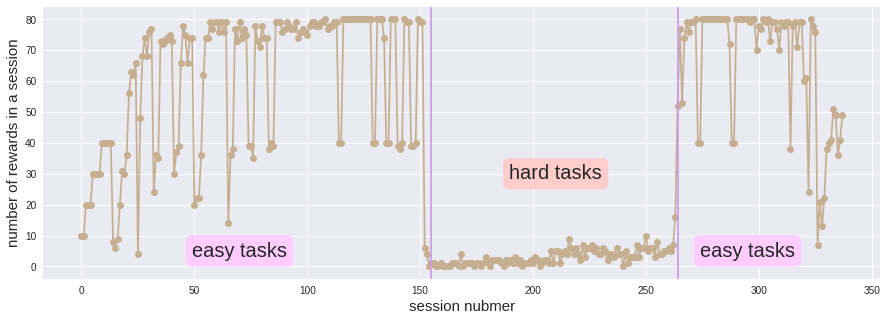

In [ ]:
#@title  {display-mode: "form"}

color = '#C6AF90'
l_color = '#CC9CE7'
plt.style.use('seaborn')
for animal in [18]:
    plt.figure(figsize=(15,5))
    ani_dio = df_AllSesInfo.query('animal_ID == @animal')
    reward = list(ani_dio['total_reward'])
    plt.plot(np.arange(len(reward)),reward, marker='o', c = color)
    plt.ylabel('number of rewards in a session',fontsize=15)
    plt.xlabel('session nubmer',fontsize=15)
    plt.axvline(x=155, c= l_color)
    plt.axvline(x=264, c= l_color)
    plt.text(210, 30, "hard tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 0.8),
                   fc=(1., 0.8, 0.8),
                   ))
    plt.text(70, 5, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))
    plt.text(295, 5, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))


<font color=#7B936F size=3>There is a difference between what we think things are and what things actually are. Here, we designed tasks that we think have different difficult levels. It is important to verify if it's the case for our experimental subjects. This lesson still holds even if the experimental subjects are humans. In fact, we should be even more careful about taking our **assumptions** as facts for other people.</font>

<font size=3>The great physcist Richard Feynman in his book [Surely you are joking, Mr.Feynman!](https://books.google.com/books?id=7papZR4oVssC&pg=PA345&lpg=PA345&dq=richard+feynman+Young%27s+experiment+rats&source=bl&ots=euWXc9nMZY&sig=ACfU3U1qsee-sl9P_D3nXJZ_RV8syIFiOQ&hl=en&sa=X&ved=2ahUKEwjut_LE_IvqAhUWsp4KHX7VDQYQ6AEwBnoECAgQAQ#v=onepage&q=richard%20feynman%20Young's%20experiment%20rats&f=false) emphasized the importance of this kind of rigor, by nicely describing a psychology experiment where the researchers of the study paid attention to the 'clues that the rat was **really** using', not what we '**think** it was using'.
    

## Space

Next, I visualized the spatial exploration within the maze after the animals finished the tasks.  
I plotted the position (the x and y coordinates) of an animal in one session, after the maze door opens.

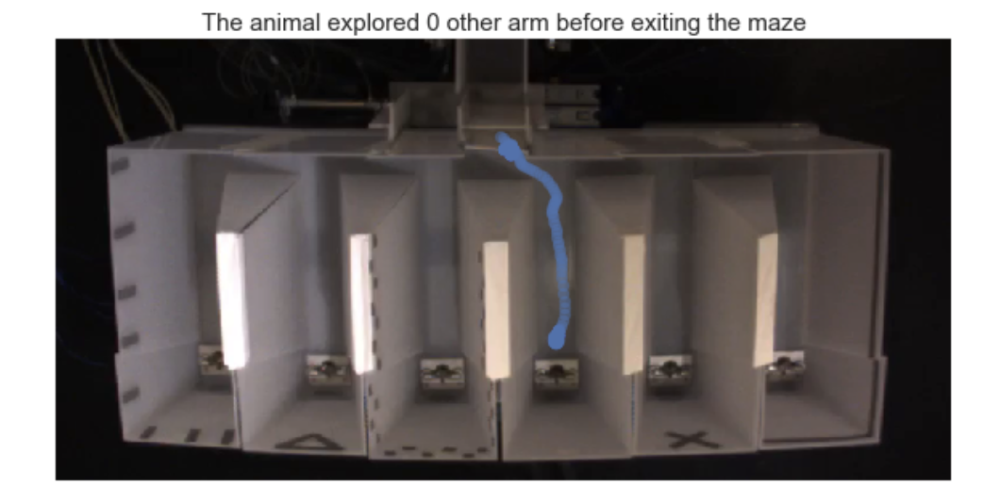

In [ ]:
#@title  {display-mode: "form"}
from IPython.display import Image
Image(filename="/content/drive/My Drive/Data_Decision_Making/one_arm.png", width=660, height=300)

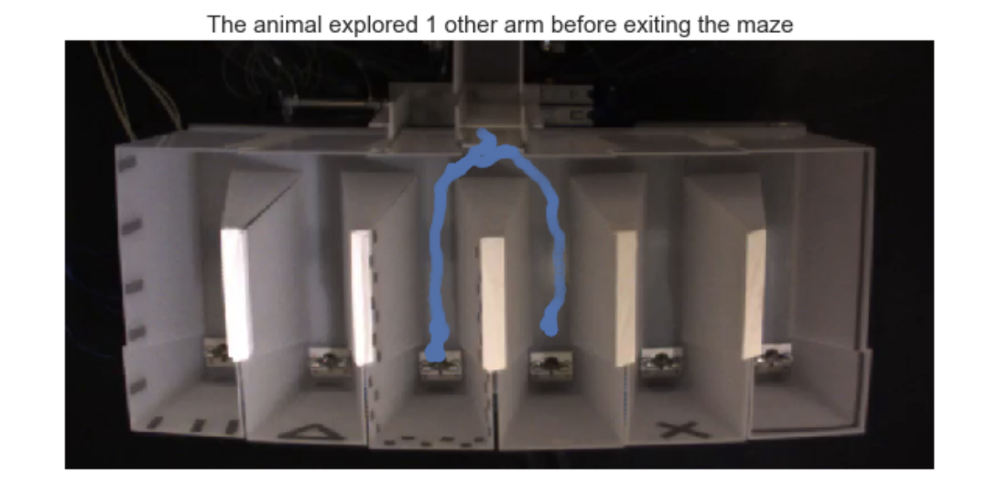

In [ ]:
#@title  {display-mode: "form"}
from IPython.display import Image
Image(filename="/content/drive/My Drive/Data_Decision_Making/two_arms.png", width=660, height=300)

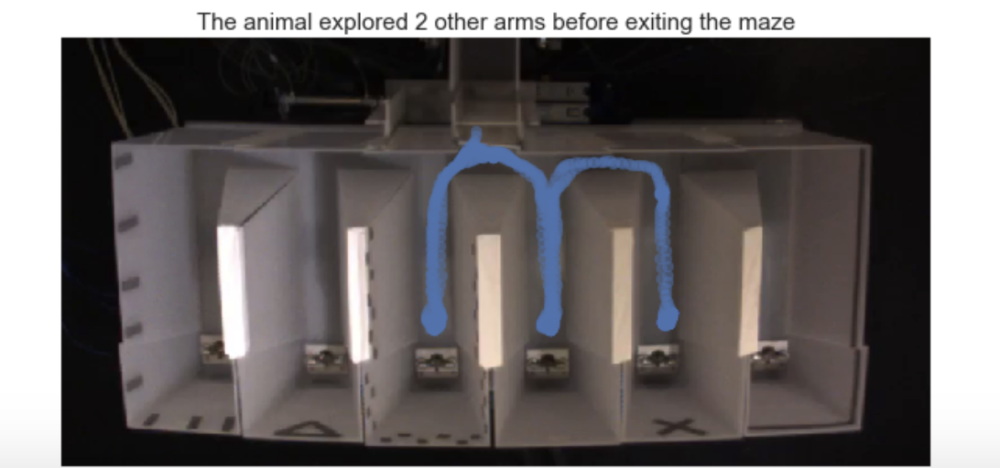

In [ ]:
#@title  {display-mode: "form"}
from IPython.display import Image
Image(filename="/content/drive/My Drive/Data_Decision_Making/three_arms.png", width=660, height=300)

From these data, I decided to extract the total distance the animal traveled after they finished the tasks.

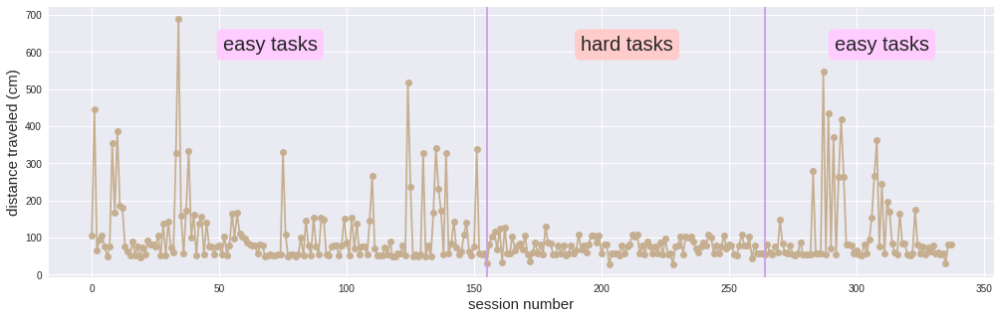

In [ ]:
#@title {display-mode: "form"}
color = '#C6AF90'
l_color = '#CC9CE7'
plt.style.use('seaborn')
for animal in [18]:
    plt.figure(figsize=(17,5))
    ani_ses = df_AllSesInfo.query('animal_ID == @animal')
    DioEndTime = list(ani_ses['dis_10f_st5'])
    plt.plot(np.arange(len(DioEndTime)),DioEndTime,marker='o',c=color)
    plt.ylabel('distance traveled (cm)',fontsize=15)
    plt.xlabel('session number',fontsize=15)
    plt.axvline(x=155, c=l_color)
    plt.axvline(x=264, c=l_color)
    plt.text(210, 620, "hard tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 0.8),
                   fc=(1., 0.8, 0.8),
                   ))
    plt.text(70, 620, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))
    plt.text(310, 620, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))


I started to notice that for the block of sessions with hard tasks, the animals consistantly traveled short distances (directly exited the maze). In contrast, for the sessions with easy tasks, the animals were more likely to periodically travel long distances (explored the maze before exiting). You can see these instances as the spikes in the plots.

## Time

Next, I analyzed the total amount of time an animal takes to exit the maze after the tasks. This is important to check because when the animals traveled longer distances, it's not necessarily true that they took longer time (eg. if they ran faster).  
I showed the data for two animals below.

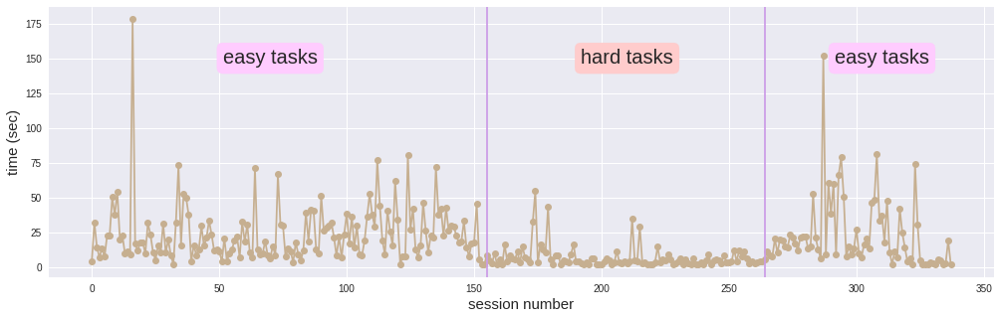

In [ ]:
#@title {display-mode: "form"}
color = '#C6AF90'
l_color = '#CC9CE7'
plt.style.use('seaborn')
for animal in [18]:
    plt.figure(figsize=(17,5))
    ani_ses = df_AllSesInfo.query('animal_ID == @animal')
    DioEndTime = list(ani_ses['time'])
    plt.plot(np.arange(len(DioEndTime)),DioEndTime,marker='o',c=color)
    plt.ylabel('time (sec)', fontsize=15)
    plt.xlabel('session number',fontsize=15)
    plt.axvline(x=155, c=l_color)
    plt.axvline(x=264, c=l_color)
    plt.text(210, 150, "hard tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 0.8),
                   fc=(1., 0.8, 0.8),
                   ))
    plt.text(70, 150, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))
    plt.text(310, 150, "easy tasks", size=20,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))


Similarly, I noticed that the animals were less likely to take a large amount of time to exit the maze for the sessions with hard tasks than the sessions with easy tasks.

To summarize the above plots, let's visualize rewards, time, and spatial information all together for a given animal.   
We can see that tasks of different difficulty levels do affect animals' subsequent maze exploration behavior.

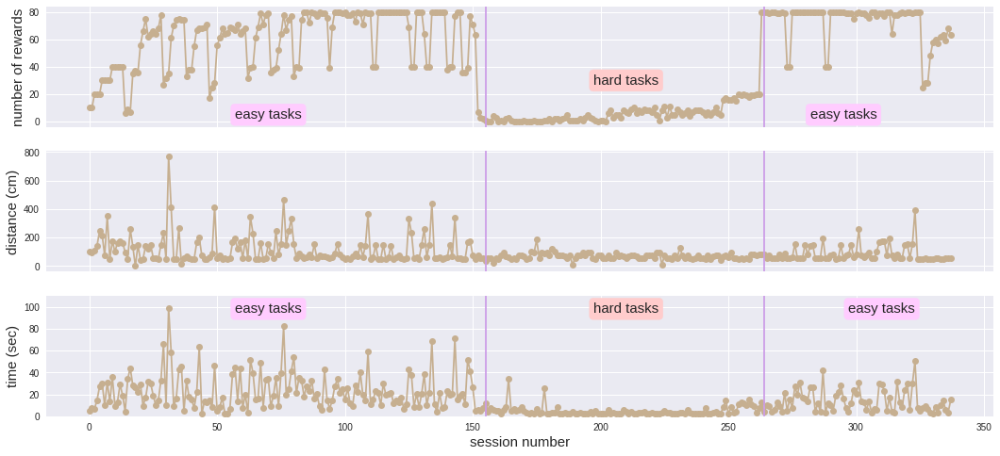

In [ ]:
#@title  {display-mode: "form"}
animal = 38
color = '#C6AF90'
l_color = '#CC9CE7'
plt.style.use('seaborn')
plt.figure(figsize=(18,8))
ani_ses = df_AllSesInfo.query('animal_ID == @animal')
reward = list(ani_ses['total_reward'])
ax1 = plt.subplot(311)
plt.plot(np.arange(len(reward)),reward, marker='o',c=color)
a = plt.setp(ax1.get_xticklabels(), visible=False)
plt.axvline(x=155, c=l_color)
plt.axvline(x=264, c=l_color)
plt.ylabel('number of rewards',fontsize=15)
plt.text(210, 30, "hard tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 0.8),
                   fc=(1., 0.8, 0.8),
                   ))
plt.text(70, 5, "easy tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))
plt.text(295, 5, "easy tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))

ani_dio = df_AllSesInfo.query('animal_ID == @animal')
dis = list(ani_dio['dis_10f_st5'])
ax2 = plt.subplot(312)
plt.plot(np.arange(len(dis)),dis,marker='o',c=color)
a = plt.setp(ax2.get_xticklabels(), visible=False)
plt.axvline(x=155, c=l_color)
plt.axvline(x=264, c=l_color)
plt.ylabel('distance (cm)',fontsize=15)

time = list(ani_ses['time'])
ax3 = plt.subplot(313,sharex=ax1)
plt.plot(np.arange(len(time)),time,marker='o',c=color)
plt.ylabel('time (sec)',fontsize=15)
plt.xlabel('session number',fontsize=15)
plt.axvline(x=155, c= l_color)
plt.axvline(x=264, c= l_color)
plt.ylim(0,110)

plt.text(210, 98, "hard tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 0.8),
                   fc=(1., 0.8, 0.8),
                   ))
plt.text(70, 98, "easy tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))
a= plt.text(310, 98, "easy tasks", size=15,
         ha="center", va="center",
         bbox=dict(boxstyle="round",
                   ec=(1, 0.8, 1),
                   fc=(1., 0.8, 1),
                   ))

# Start position as another variable

A closer look at the data reveals that there is another variable that influences the results shown above. This variable is the **start position** of the animal when the maze door opens. As you can see in the figure below, the shortest path the animal could take to exit the maze depends on if the animal started at one of the close, medium, or far arms (relative to the maze door).

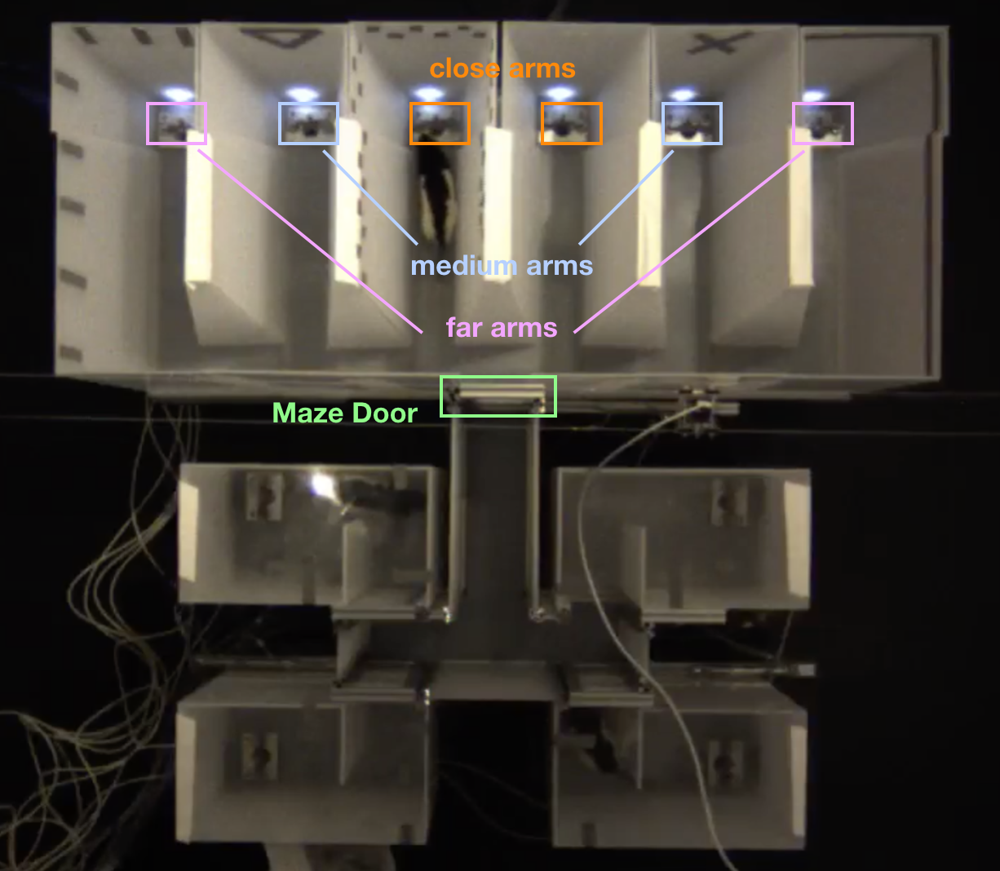

In [ ]:
#@title  {display-mode: "form"}
from IPython.display import Image
Image(filename="/content/drive/My Drive/Data_Decision_Making/arms.png", width=450, height=400)

To account for this, I split the data accroding to the start position. In the following visulization, we can see that the **start position** did affect both time and distance in the way we predicted. (i.e. if the animal started at the far arms, they tend to take longer time and travel longer distance) We therefore conducted all our analysis separately in the subsequent sections.

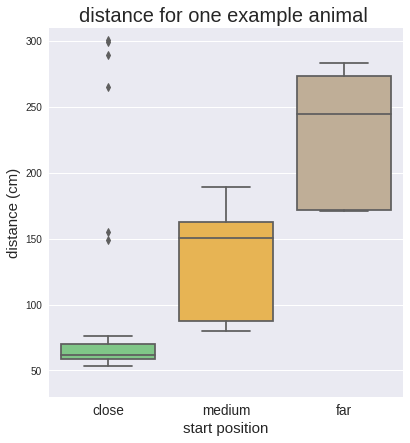

In [ ]:
#@title {display-mode: "form"}

animal = 25
g=sns.catplot(x='StartPos_dis',order = [0,1,2],
             y='dis_10f_st5',
data=df_SesInfo.query('animal_ID == @animal & contingency=="Before_NoCenter"'), kind='box')
axes = g.axes
axes[0,0].set(ylim=(30,310))
axes[0,0].set_title('distance for one example animal ',fontsize=20)
axes[0,0].set_ylabel('distance (cm)',fontsize=15)
axes[0,0].set_xlabel('start position',fontsize=15)
axes[0,0].set_xticklabels(['close','medium','far'], fontsize=13.6)
g.fig.set_size_inches(6,6)


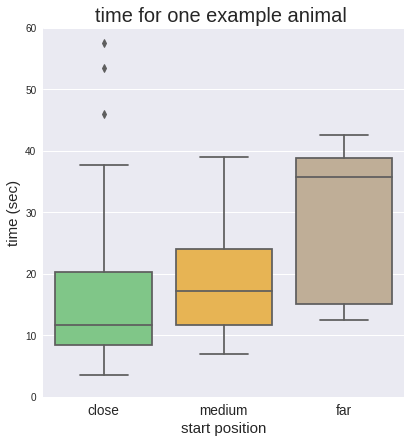

In [ ]:
#@title {display-mode: "form"}
animal = 25
g=sns.catplot(x='StartPos_dis',order = [0,1,2],
             y='time',
data=df_SesInfo.query('animal_ID == @animal & contingency=="Before_NoCenter"'), kind='box')
axes = g.axes
axes[0,0].set(ylim=(0,60))
axes[0,0].set_title('time for one example animal ',fontsize=20)
axes[0,0].set_ylabel('time (sec)',fontsize=15)
axes[0,0].set_xlabel('start position',fontsize=15)
axes[0,0].set_xticklabels(['close','medium','far'], fontsize=13.6)
g.fig.set_size_inches(6,6)


# Data for individual animals are not guassian/normal

The next step is to develop a meaninful metric to summarize the data for individual animals. However, a <font                                                                                                 color=red>faulty, but easily fallen into </font> approach is to assume the distribution is normal and only look at the averages. A careful look at the data (plotting the histogram) demonstrates that the distributions of measurements are **not normal**, so the mean and median are different, as plotted below. This realization is important in choosing the right statistical test later on because a lot of the statistical test are based on the assumption that the measurements have normal distributions.

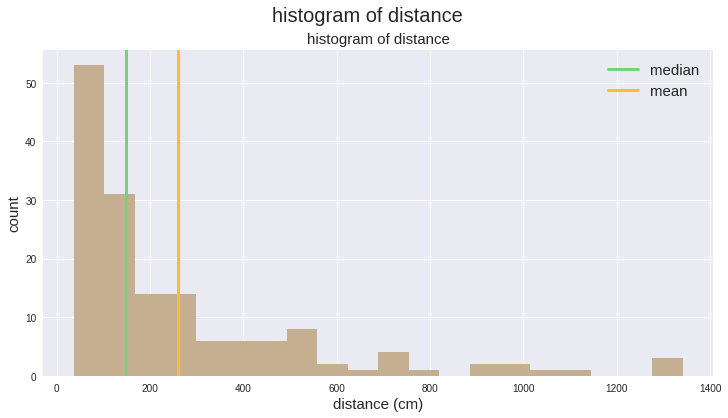

In [ ]:
#@title {display-mode: "form"}
color = '#C6AF90'
for animal in [4]:
    df = df_SessionTable
    distance = list(df.loc[(df.animal_ID == animal) & ((df.contingency == 'Before_NoCenter')
                   | (df.contingency == 'After_NoCenter')),'dis_10f_st5'])
    plt.figure(figsize=(12,6))
    plt.suptitle('histogram of distance',fontsize=20)
    (n, bins, patches) = plt.hist(distance,bins=20,color=color)
    plt.title('histogram of distance',fontsize=15)
    plt.ylabel('count',fontsize=15)
    plt.xlabel('distance (cm)',fontsize=15)
    plt.axvline(x=np.median(distance),c='#75D17F',label='median',lw=3)
    plt.axvline(x=np.mean(distance),c='#FFBB3C',label='mean',lw=3)
    plt.legend(loc='best',fontsize=15)


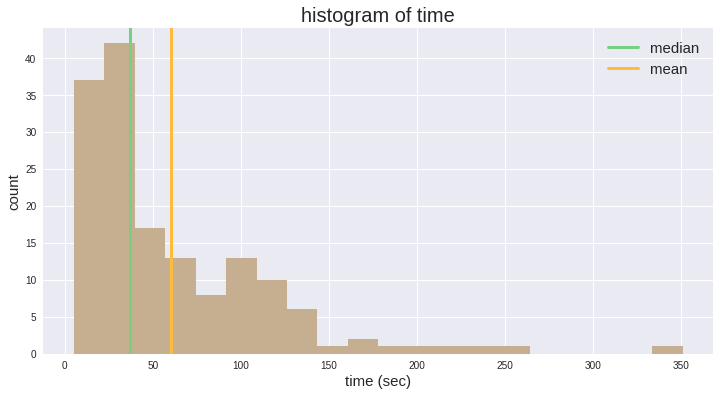

In [ ]:
#@title {display-mode: "form"}
plt.style.use('seaborn')
color = '#C6AF90'
for animal in [4]:
    df = df_SessionTable
    time = list(df.loc[(df.animal_ID == animal) & ((df.contingency == 'Before_NoCenter')
                   | (df.contingency == 'After_NoCenter')),'time'])
    plt.figure(figsize=(12,6))
    plt.title('time',fontsize=20)
    (n, bins, patches) = plt.hist(time,bins=20,color=color)
    plt.title('histogram of time',fontsize=20)
    plt.ylabel('count',fontsize=15)
    plt.xlabel('time (sec)',fontsize=15)
    plt.axvline(x=np.median(time),c='#75D17F',label='median',lw=3)
    plt.axvline(x=np.mean(time),c='#FFBB3C',label='mean',lw=3)
    plt.legend(loc='best',fontsize=15)


<font size=3>
    
I ran the Shapiro–Wilk test to evaluate the normality of the distributions. The null-hypothesis of this test is that the population is normally distributed. For our data, 91.1% of the data for distance and 89.6% for time have a p value smaller than 0.05, strongly indicating that the distributions are not normal for most animals. I reported the [full results](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=p94SVuka2eU-) in the supplementary session.

<font size=3>Note that I am very careful to <font color=red>avoid using the term 'statistically significant'</font> due to the growing recognition that this term is very misleading. For example, see the paper published on [Nature](https://www.nature.com/articles/d41586-019-00857-9) in 2019. One of the reasons is that categorical statements like X phenomenon is 'statistically significant' vs. 'not significant' mislead us to believe that certain statements or phenomena are real or to make overcofident claims. I highly value the spirit of **embracing uncertainty** and **spending more time on thinking** about the nuances of any statistical results.


# Metrics and statistics to summarzie individual animal data

Given that the distributions of both time and ditances are not normal, I chose the **mean**, the **median** and **interquartile range**    as quantities to describe the distributions from different perspectives.

The following plots showed data from one animal.We can see that all three summary statistics (the mean, the median, and the interquartile range) were lower for sessions with hard tasks compared to for sessions with easy tasks.

Note that these plots only show one animal and only when its start position was at medium arms. I have included the [multivariate plots](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=lv9w8UlE2eU_) for the other animals and start positions in the supplementary plot section.



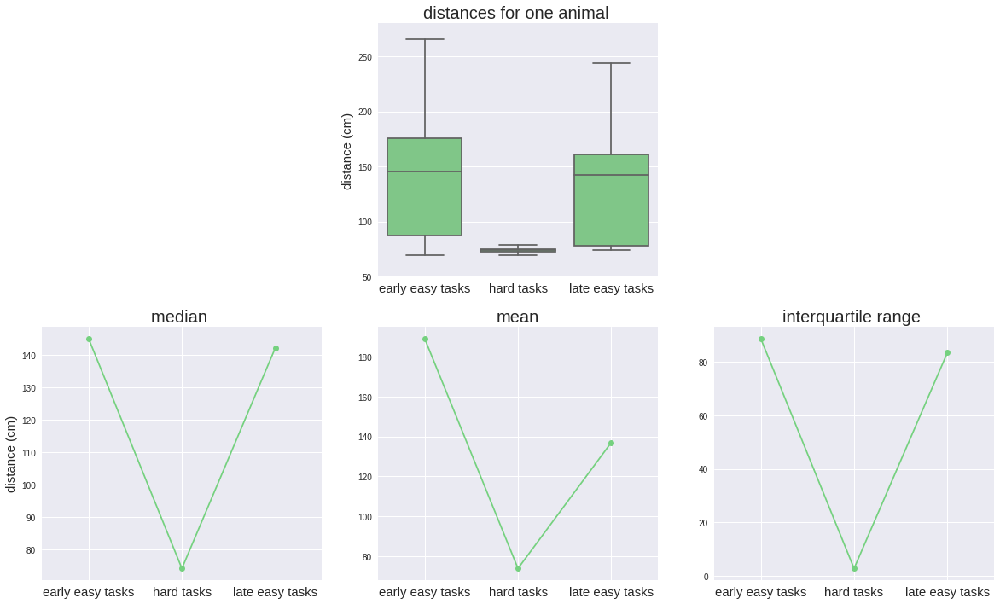

In [ ]:
#@title {display-mode: "form"}
animal =31
palette = sns.husl_palette(3)
data=df_SesInfo.query('animal_ID == @animal & StartPos_dis ==1 ')
sum_data = df_SumInfo.query('animal_ID == @animal & StartPos_dis ==1 ')
df_SumInfo
f,axes =plt.subplots(2,3,figsize=(20,12))
sns.boxplot(x="contingency", y="dis_10f_st5", data=data,color=My_palette[0],ax=axes[0,1])
axes[0,1].set(ylim=(50,280),xlabel='')
axes[0,1].set_title('distances for one animal ',fontsize=20)
axes[1,0].plot("contingency", "median_dis_10f_st5", data=sum_data,color=My_palette[0],marker='o')
axes[1,0].set_title('median ',fontsize=20)
axes[1,2].plot("contingency", "iqr_dis_10f_st5", data=sum_data,color=My_palette[0],marker='o')
axes[1,2].set_title('interquartile range ',fontsize=20)
axes[1,1].plot("contingency", "mean_dis_10f_st5", data=sum_data,color=My_palette[0],marker='o')
axes[1,1].set_title('mean',fontsize=20)
for row in range(2):
    for col in range(3):
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].set_xlim(-0.5,2.5)
axes[0,1].set_ylabel('distance (cm)',fontsize=15)
axes[1,0].set_ylabel('distance (cm)',fontsize=15)
axes[0,0].set_axis_off()
axes[0,2].set_axis_off()

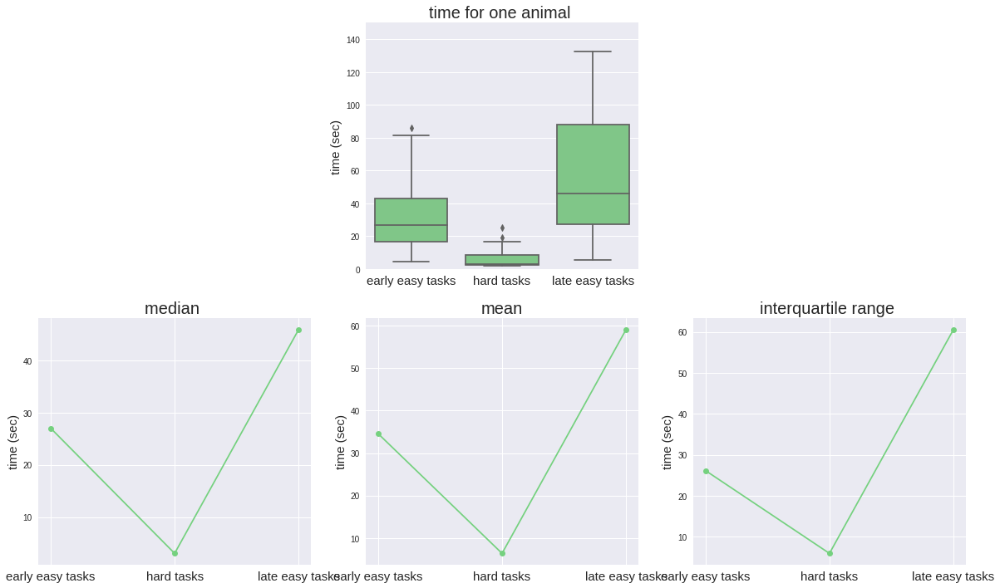

In [ ]:
#@title  {display-mode: "form"}
animal =31
palette = sns.husl_palette(3)
data=df_SesInfo.query('animal_ID == @animal & StartPos_dis ==1 ')
sum_data = df_SumInfo.query('animal_ID == @animal & StartPos_dis ==1 ')
df_SumInfo
f,axes =plt.subplots(2,3,figsize=(20,12))
sns.boxplot(x="contingency", y="time", data=data,color=My_palette[0],ax=axes[0,1])
axes[0,1].set(ylim=(0,150),xlabel='')
axes[0,1].set_title('time for one animal ',fontsize=20)
axes[1,0].plot("contingency", "median_time", data=sum_data,color=My_palette[0],marker='o')
axes[1,0].set_title('median ',fontsize=20)
axes[1,2].plot("contingency", "iqr_time", data=sum_data,color=My_palette[0],marker='o')
axes[1,2].set_title('interquartile range ',fontsize=20)
axes[1,1].plot("contingency", "mean_time", data=sum_data,color=My_palette[0],marker='o')
axes[1,1].set_title('mean',fontsize=20)
for row in range(2):
    for col in range(3):
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].set_ylabel('time (sec)', fontsize=15)
axes[0,1].set_ylabel('time (sec)',fontsize=15)
axes[0,0].set_axis_off()
axes[0,2].set_axis_off()

# Across animal summary
Below, I plot the median and the 95% bootstrap confidence interval across animals for the three summary statistics (mean, median, interquartile range). Each dot is the median across animals. The [multivariate plots](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=lv9w8UlE2eU_) are included in the supplementary section.

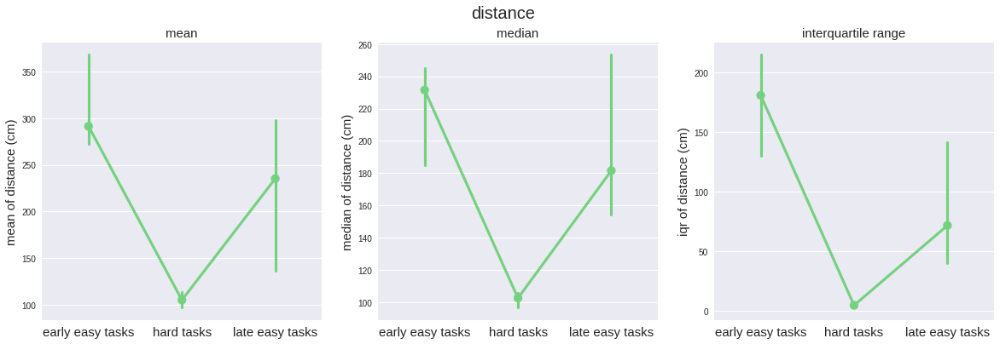

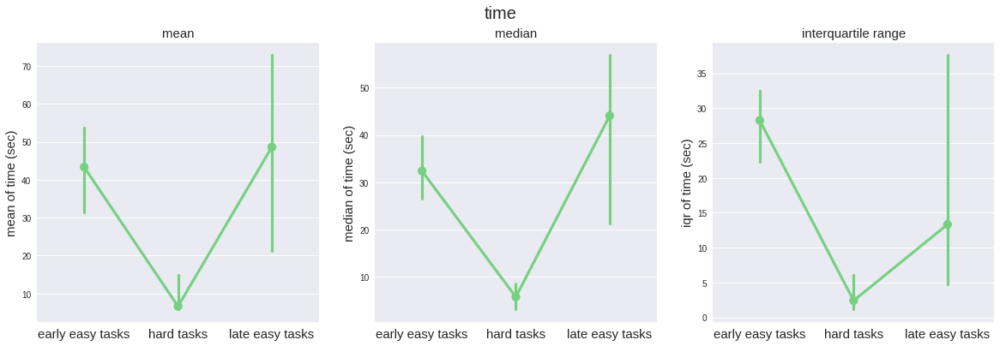

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('distance', fontsize = 20)

sns.pointplot('contingency', 'mean_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[0],estimator =median)

axes[0].set_ylabel('mean of distance (cm)',fontsize=15)
axes[0].set_title('mean',fontsize=15)

sns.pointplot('contingency', 'median_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[1],estimator =median)
axes[1].set_ylabel('median of distance (cm)',fontsize=15)
axes[1].set_title('median',fontsize=15)

sns.pointplot('contingency', 'iqr_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[2],estimator =median)
axes[2].set_ylabel('iqr of distance (cm)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)

for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')

f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('time', fontsize = 20)

sns.pointplot('contingency', 'mean_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[0],estimator =median)
axes[0].set_ylabel('mean of time (sec)',fontsize=15)
axes[0].set_title('mean',fontsize=15)

sns.pointplot('contingency', 'median_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[1],estimator =median)
axes[1].set_ylabel('median of time (sec)',fontsize=15)
axes[1].set_title('median',fontsize=15)

sns.pointplot('contingency', 'iqr_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[2],estimator =median)
axes[2].set_ylabel('iqr of time (sec)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)

for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')


Since I have shown that the distributions of time and distance are not normal, I used **the Wilcoxon rank-sum test** to evaluate the differences (of distance and time) between easy and hard tasks. The  Wilcoxon rank-sum test is often described as the non-parametric version of the two-sample t-test that is not based on the assumption that the data are normally distributed. For these data, 77% of the comparisons showed a strong indication (p < 0.05) that the animals spent less time in hard compared to easy tasks. Likewise, 60% of the comparisons showed a strong indication (p < 0.05) that the animals traveled shorter distance in hard compared to easy tasks.
    
I have included [plots of the p values](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=w5TtaJdA2eVG) of all the individual  Wilcoxon rank-sum tests in the supplementary sesion.

# Role of a brain region

In order to answer the question of which brain region is involved in this process, we decided to carry out a lesion study. Conducting lesion studies is a powerful way to investigate the necessasity of a specific brain region for a brain function. For this study, we selectively lesioned the *hippocampus*, a brain region that is thought to play an important role in spatial nevigation and memory.

In the top row of the plots below, we can see that control and lesion animals form different clusters, especially for both early and late easy tasks. The corresponding [multivariate plots](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=xIC2pPLS2eVI) are included in the supplementary section.

Another way to look at this is that lesion animals did not change their behavior as much after experiencing tasks of different difficulties. In the second row of the plots, we can see that although lesion animals do modulate their time and distance in easy vs. hard tasks, the amount of modulation is less than control animals.

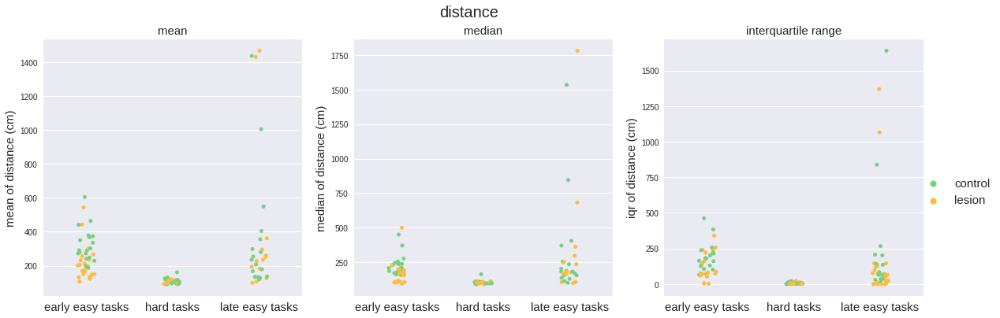

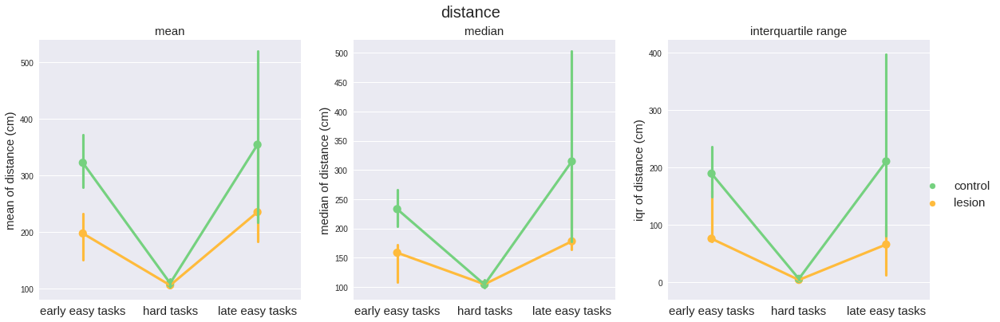

In [ ]:
#@title {display-mode: "form"}

f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('distance',fontsize=20)
axes[0]= sns.stripplot('contingency', 'mean_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of distance (cm)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.stripplot('contingency', 'median_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of distance (cm)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.stripplot('contingency', 'iqr_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[2])

axes[2].set_ylabel('iqr of distance (cm)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')


f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('distance', fontsize = 20)
sns.pointplot('contingency', 'mean_dis_10f_st5', estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[0])
sns.pointplot('contingency', 'mean_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[0])
axes[0].set_ylabel('mean of distance (cm)',fontsize=15)
axes[0].set_title('mean',fontsize=15)

sns.pointplot('contingency', 'median_dis_10f_st5',  estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[1])
sns.pointplot('contingency', 'median_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[1])
axes[1].set_ylabel('median of distance (cm)',fontsize=15)
axes[1].set_title('median',fontsize=15)

sns.pointplot('contingency', 'iqr_dis_10f_st5',  estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[2])
sns.pointplot('contingency', 'iqr_dis_10f_st5',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[2])
axes[2].set_ylabel('iqr of distance (cm)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)

axes[2].scatter([-10],[-100],c=My_palette[0],label='control')
axes[2].scatter([-10],[-100],c=My_palette[1],label='lesion')
axes[2].set(xlim=(-0.5,2.5),ylim=(-30,None))
axes[2].legend(loc='best',bbox_to_anchor=(0.77, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')

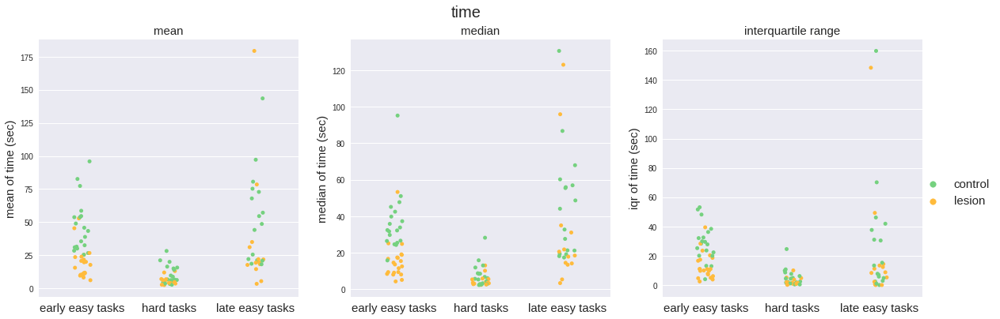

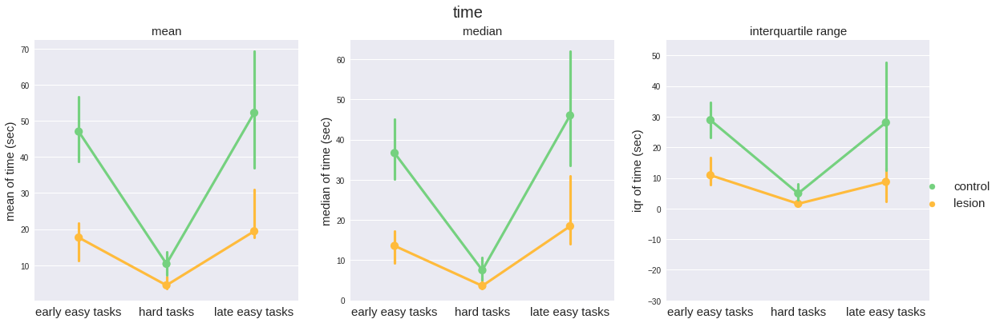

In [ ]:
#@title {display-mode: "form"}

f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('time',fontsize=20)
axes[0]= sns.stripplot('contingency', 'mean_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of time (sec)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.stripplot('contingency', 'median_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of time (sec)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.stripplot('contingency', 'iqr_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_SumInfo.query('StartPos_dis == 2'),palette=My_palette,
              jitter=0.1,ax=axes[2])

axes[2].set_ylabel('iqr of time (sec)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')

f, axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('time', fontsize = 20)
sns.pointplot('contingency', 'mean_time', estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[0])
sns.pointplot('contingency', 'mean_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[0])
axes[0].set_ylabel('mean of time (sec)',fontsize=15)
axes[0].set_title('mean',fontsize=15)

sns.pointplot('contingency', 'median_time',  estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[1])
sns.pointplot('contingency', 'median_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[1])
axes[1].set_ylabel('median of time (sec)',fontsize=15)
axes[1].set_title('median',fontsize=15)

sns.pointplot('contingency', 'iqr_time',  estimator=median,
              data=df_SumInfo.query('animal_operation == "lesion" & StartPos_dis == 2'),
              marker='o',color=My_palette[1],ax=axes[2])
sns.pointplot('contingency', 'iqr_time',
              data=df_SumInfo.query('animal_operation == "control" & StartPos_dis == 2'),
              marker='o',color=My_palette[0],ax=axes[2])
axes[2].set_ylabel('iqr of time (sec)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)

axes[2].scatter([-10],[-100],c=My_palette[0],label='control')
axes[2].scatter([-10],[-100],c=My_palette[1],label='lesion')
axes[2].set(xlim=(-0.5,2.5),ylim=(-30,None))
axes[2].legend(loc='best',bbox_to_anchor=(0.77, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
    axes[col].set_xlabel('')


## The difference metric

While the above plots show the distributions across animals, we are particularly interested in the **change** of each individual animal's behavior after they experience tasks of different difficulties. Therefore, I calculated the **differences** of each animal's time and distance between the easy and hard tasks.

The plots below show that the differences are smaller for hippocampal lesion animals compared to control animals. This indicates that the hippocampus plays a role in modulating the animals' behavior after they experience tasks of different difficulties. The [multivariate plots](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=xIC2pPLS2eVI) are included in the supplementary section.

I used Wilcoxon rank-sum test to validate this differential modulation for control and lesion animals. The [multivariate p value plots](https://colab.research.google.com/drive/1zG-DEfUeieh2FD5BklyF0PG_Z3PaUxHL#scrollTo=xIC2pPLS2eVI) are included in the supplementary section.

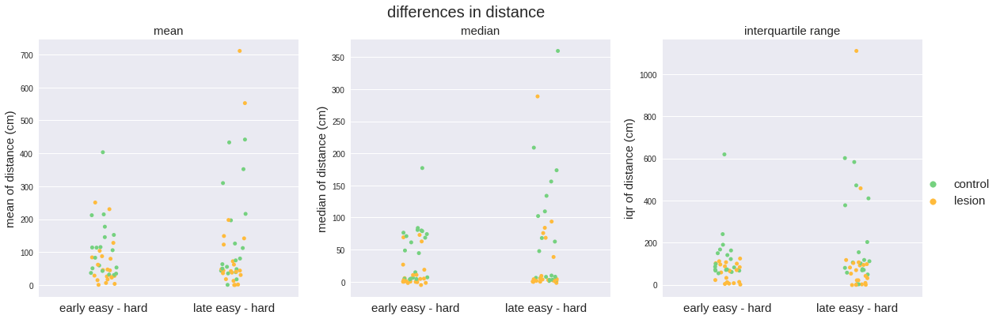

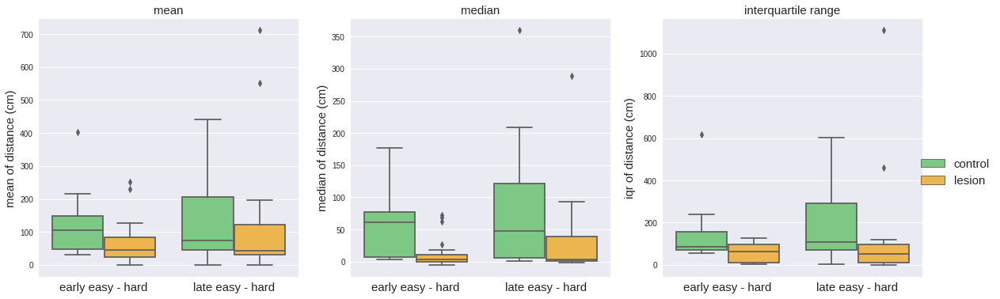

In [ ]:
#@title  {display-mode: "form"}

f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('differences in distance',fontsize=20)
axes[0]= sns.stripplot('diff', 'mean_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of distance (cm)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.stripplot('diff', 'diff_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of distance (cm)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.stripplot('diff', 'iqr_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[2])

axes[2].set_ylabel('iqr of distance (cm)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
    axes[col].set_xlabel('')


f,axes = plt.subplots(1,3,figsize=(20,6))
axes[0]= sns.boxplot('diff', 'mean_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of distance (cm)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.boxplot('diff', 'diff_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of distance (cm)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.boxplot('diff', 'iqr_dis_10f_st5', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[2])

axes[2].set_ylabel('iqr of distance (cm)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
    axes[col].set_xlabel('')

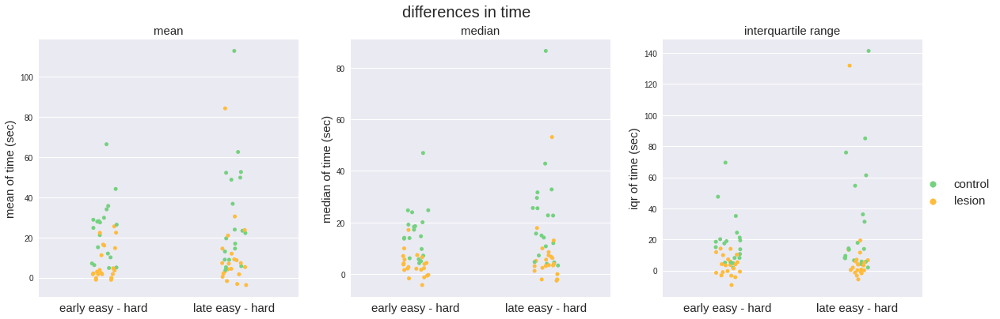

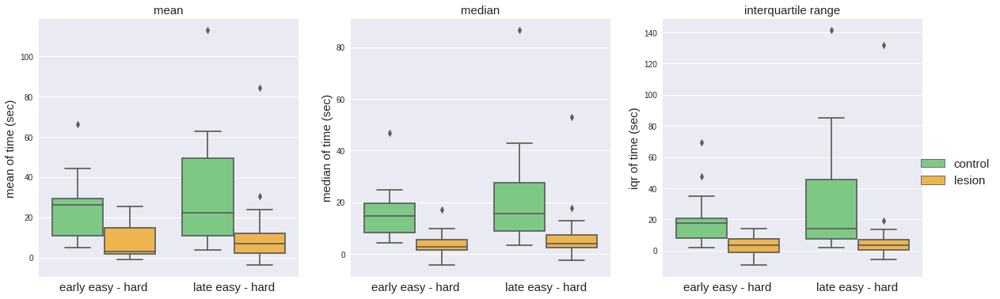

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(1,3,figsize=(20,6))
f.suptitle('differences in time',fontsize=20)
axes[0]= sns.stripplot('diff', 'mean_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of time (sec)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.stripplot('diff', 'diff_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of time (sec)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.stripplot('diff', 'iqr_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              jitter=0.1,ax=axes[2])

axes[2].set_ylabel('iqr of time (sec)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
    axes[col].set_xlabel('')

f,axes = plt.subplots(1,3,figsize=(20,6))
axes[0]= sns.boxplot('diff', 'mean_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[0])
axes[0].legend_.remove()
axes[0].set_ylabel('mean of time (sec)' ,fontsize=15)
axes[0].set_title('mean',fontsize=15)

axes[1]= sns.boxplot('diff', 'diff_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[1])
axes[1].legend_.remove()
axes[1].set_ylabel('median of time (sec)',fontsize=15)
axes[1].set_title('median',fontsize=15)

axes[2]= sns.boxplot('diff', 'iqr_time', hue='animal_operation',hue_order=['control','lesion'],
              data=df_DiffSumInfo.query('StartPos_dis == 1'),palette=My_palette,
              saturation=0.8,ax=axes[2])

axes[2].set_ylabel('iqr of time (sec)',fontsize=15)
axes[2].set_title('interquartile range',fontsize=15)
axes[2].legend(loc='best',bbox_to_anchor=(0.8, 0., 0.5, 0.5),fontsize=15)
for col in range(3):
    axes[col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
    axes[col].set_xlabel('')

# Impact

<font size=3>Surving in a world with changing circumstances requires animals to recognize and respond to those changes by flexibly modulating their decisions and behavior. Although this study looked at one very specific decison making scenario, the results address a much broader scientific question: How do different experiences affect subsequent decision making? And how does the brain support this differential decision making? This study is one small step towards understanding these questions. It has also motivated ongoing experiments in the lab to further investigate the neural mechanisms and computations underlying this flexible decision making process.

---
---

# Acknowledgements
This work has been carries out in close collaboration with my scientific mentor Dr. David Kastner in the lab of Dr. Loren Frank at UCSF.

# Supplementary plots

## Full results of Shapiro-Wilk test for distribution normality

These plots show that the distribution of time and distances are not consistent with a normal distribution across the majority of animals, task difficulties, and start positions. The red line indicates p=0.05, each dot represents the p value of one animal, under a given task difficulty level and start position.

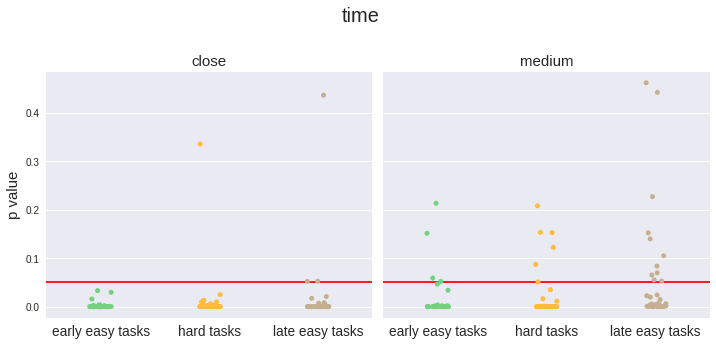

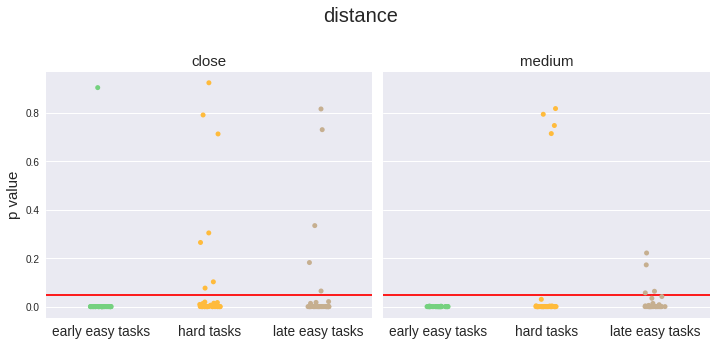

In [ ]:
#@title  {display-mode: "form"}
df_shaprio_time = plot_shapiro(value='time',LogOrRaw='raw')
df_shaprio_distance = plot_shapiro(value='dis_10f_st5',LogOrRaw='raw')


## Multivariate plots for individual animals

Here I show some multivariate summary plots where each row represents a different start position and each column represents a different summary statistic within animals. Each curve represents one animal. We can see that both distance and time are smaller for sessions with hard tasks, compared to the early and late easy tasks, for many of the animals.

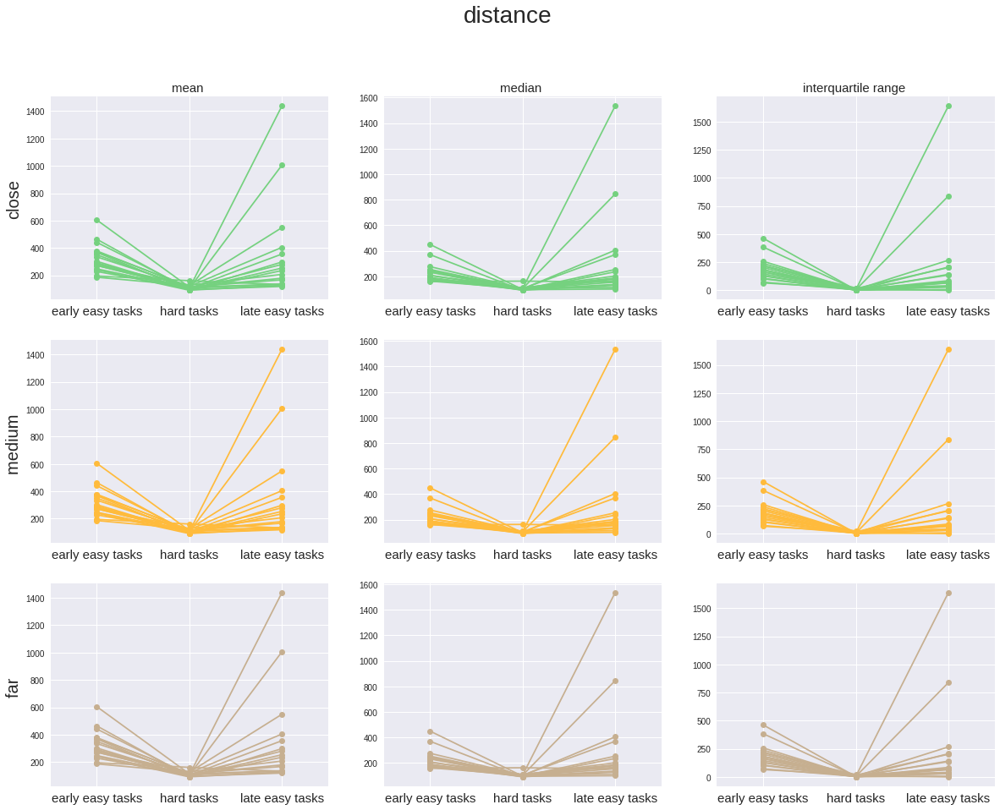

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('distance',fontsize=28)
mmi = ['mean','median','iqr']
for animal in control_animal:
    for row in range(3):
        sum_data = df_SumInfo.query('animal_ID == @animal & StartPos_dis == @col')
        axes[row,0].plot("contingency", "mean_dis_10f_st5", data=sum_data,color=My_palette[row],marker='o')
        axes[row,0].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,0].set_xlim(-0.5,2.5)

        axes[row,1].plot("contingency", "median_dis_10f_st5", data=sum_data,color=My_palette[row],marker='o')
        axes[row,1].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,1].set_xlim(-0.5,2.5)

        axes[row,2].plot("contingency", "iqr_dis_10f_st5", data=sum_data,color=My_palette[row],marker='o')
        axes[row,2].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,2].set_xlim(-0.5,2.5)

axes[0,0].set_title('mean ', fontsize=15)
axes[0,1].set_title('median ', fontsize=15)
axes[0,2].set_title('interquartile range ', fontsize=15)
axes[0,0].set_ylabel('close', fontsize=20)
axes[1,0].set_ylabel('medium ', fontsize=20)
a= axes[2,0].set_ylabel('far ', fontsize=20)

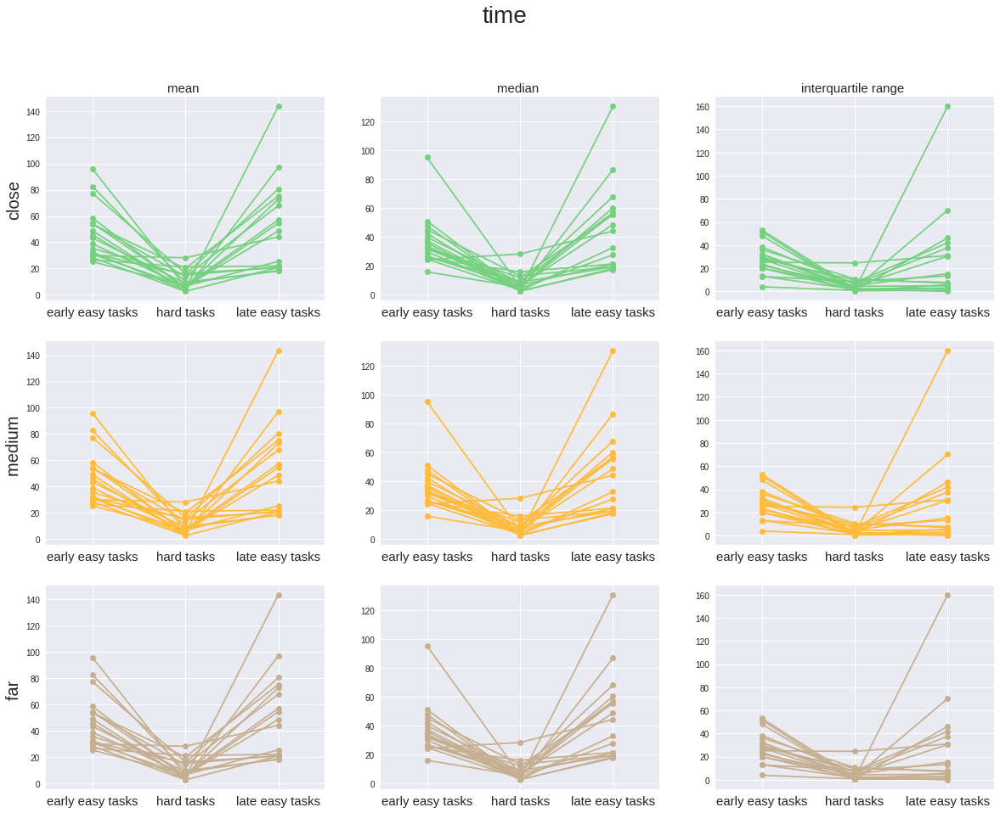

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('time',fontsize=28)
mmi = ['mean','median','iqr']
for animal in control_animal:
    for row in range(3):
        sum_data = df_SumInfo.query('animal_ID == @animal & StartPos_dis == @col')
        axes[row,0].plot("contingency", "mean_time", data=sum_data,color=My_palette[row],marker='o')
        axes[row,0].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,0].set_xlim(-0.5,2.5)

        axes[row,1].plot("contingency", "median_time", data=sum_data,color=My_palette[row],marker='o')
        axes[row,1].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,1].set_xlim(-0.5,2.5)

        axes[row,2].plot("contingency", "iqr_time", data=sum_data,color=My_palette[row],marker='o')
        axes[row,2].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,2].set_xlim(-0.5,2.5)

axes[0,0].set_title('mean ', fontsize=15)
axes[0,1].set_title('median ', fontsize=15)
axes[0,2].set_title('interquartile range ', fontsize=15)
axes[0,0].set_ylabel('close', fontsize=20)
axes[1,0].set_ylabel('medium ', fontsize=20)
a= axes[2,0].set_ylabel('far ', fontsize=20)

## Multivariate summary across animals

Below is a summary plot where each dot is the median of all the animals and the range indicated by the vertical lines are the 95% bootstrapped confidence intervals.

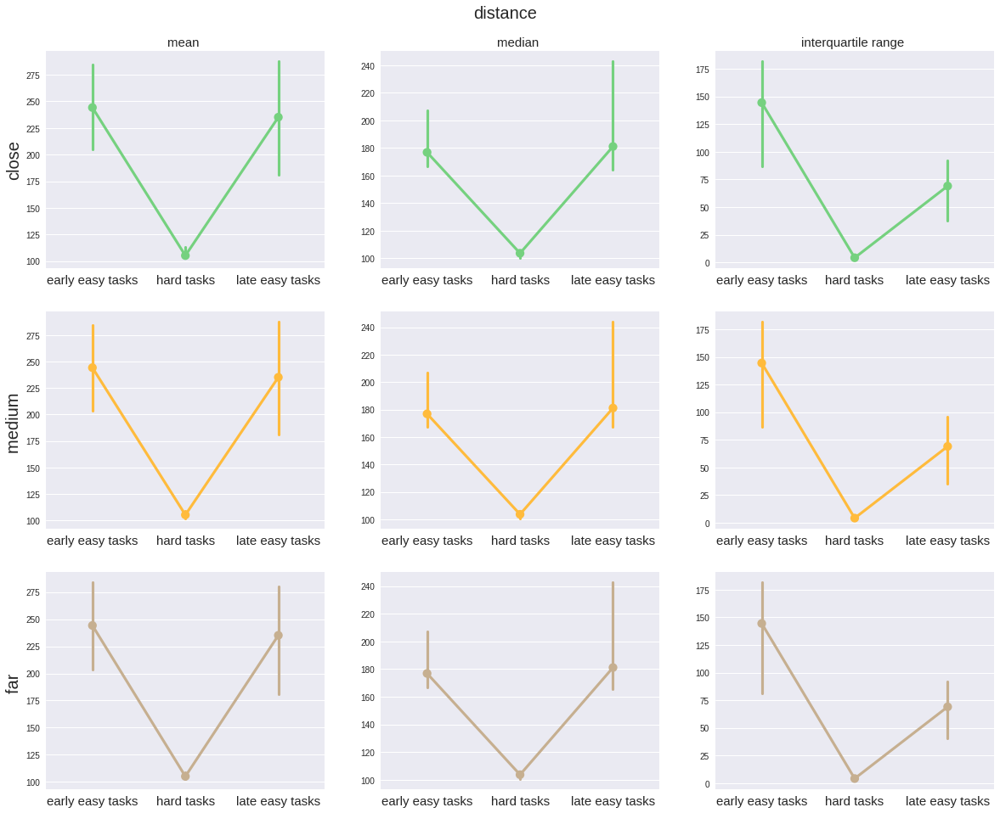

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('distance',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @col')
    axes[row,0]=sns.pointplot("contingency", "mean_dis_10f_st5", data=sum_data,
                          color=My_palette[row],marker='o', estimator=median,ax=axes[row,0])

    axes[row,1]=sns.pointplot("contingency", "median_dis_10f_st5", data=sum_data,
                     color=My_palette[row],marker='o', estimator=median,ax=axes[row,1])

    axes[row,2]=sns.pointplot("contingency", "iqr_dis_10f_st5",  data=sum_data,
                     color=My_palette[row],marker='o', estimator=median,ax=axes[row,2])
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
axes[0,0].set_title('mean ', fontsize=15)
axes[0,1].set_title('median ', fontsize=15)
axes[0,2].set_title('interquartile range ', fontsize=15)
axes[0,0].set_ylabel('close', fontsize=20)
axes[1,0].set_ylabel('medium ', fontsize=20)
a= axes[2,0].set_ylabel('far ', fontsize=20)

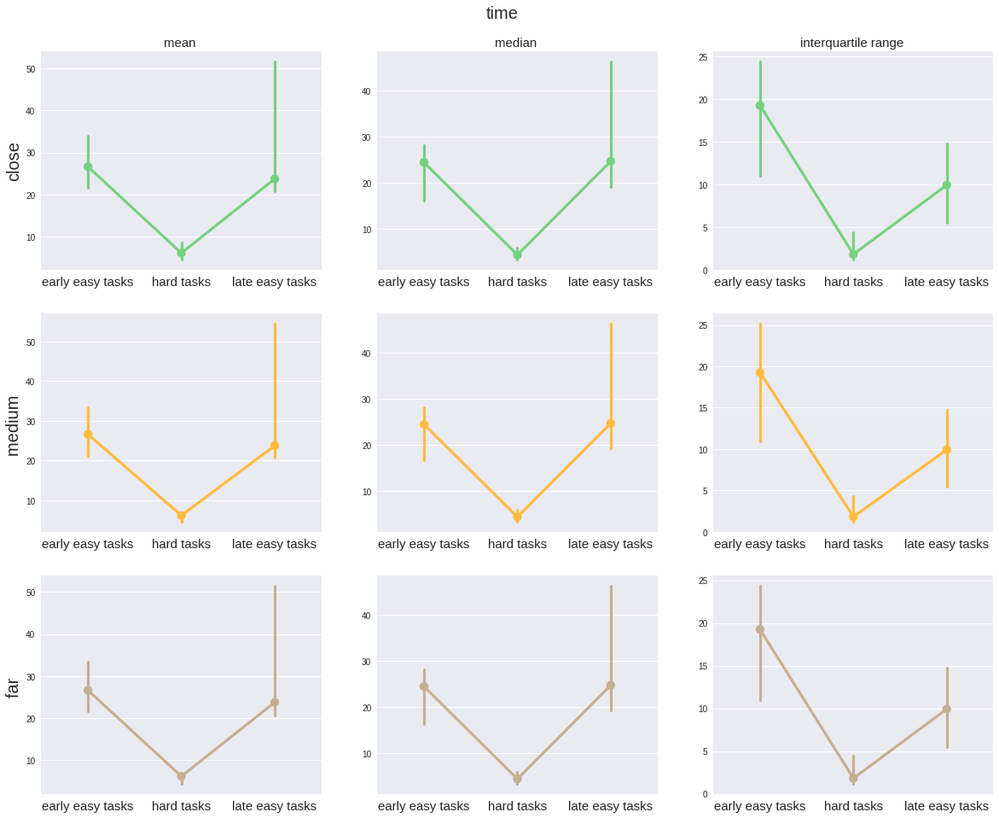

In [ ]:
#@title  {display-mode: "form"}

f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('time',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @col')
    axes[row,0]=sns.pointplot("contingency", "mean_time", data=sum_data,
                          color=My_palette[row],marker='o', estimator=median,ax=axes[row,0])

    axes[row,1]=sns.pointplot("contingency", "median_time", data=sum_data,
                     color=My_palette[row],marker='o', estimator=median,ax=axes[row,1])

    axes[row,2]=sns.pointplot("contingency", "iqr_time",  data=sum_data,
                     color=My_palette[row],marker='o', estimator=median,ax=axes[row,2])
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
axes[0,0].set_title('mean ', fontsize=15)
axes[0,1].set_title('median ', fontsize=15)
axes[0,2].set_title('interquartile range ', fontsize=15)
axes[0,0].set_ylabel('close', fontsize=20)
axes[1,0].set_ylabel('medium ', fontsize=20)
a= axes[2,0].set_ylabel('far ', fontsize=20)


##  Wilcoxon rank-sum tests on individual animal

As shown below, most of the animals have p values smaller than 0.05, indicating that animals modulate time and distance for tasks of different difficulties.

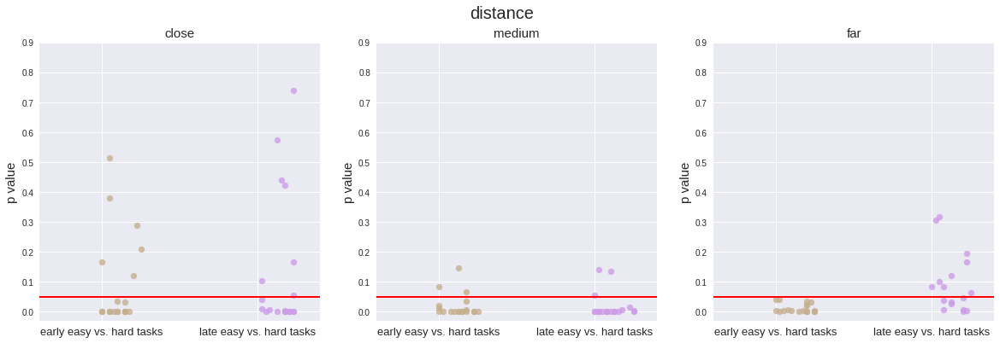

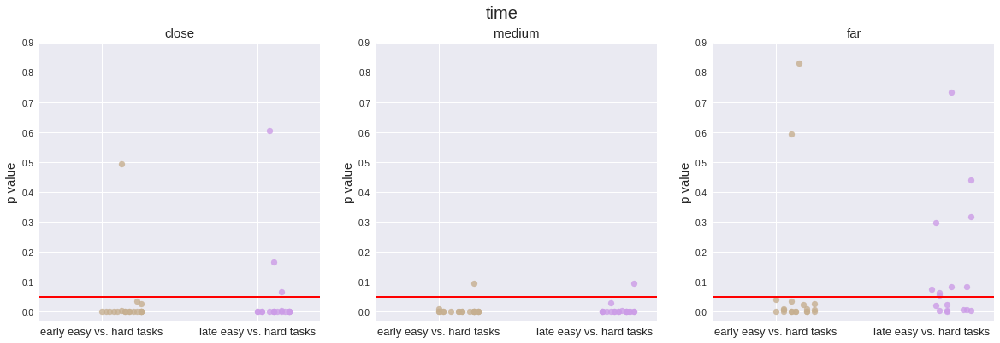

In [ ]:
#@title  {display-mode: "form"}
plot_IndiAni_ranksum(item='dis',animal_type =control_animal)
plot_IndiAni_ranksum(item='time',animal_type =control_animal)

## Multivariant plots of control and experimental groups

Below we can see from both the scatter plots and box plots that control animals and lesion animals have different time and distance for easy tasks.

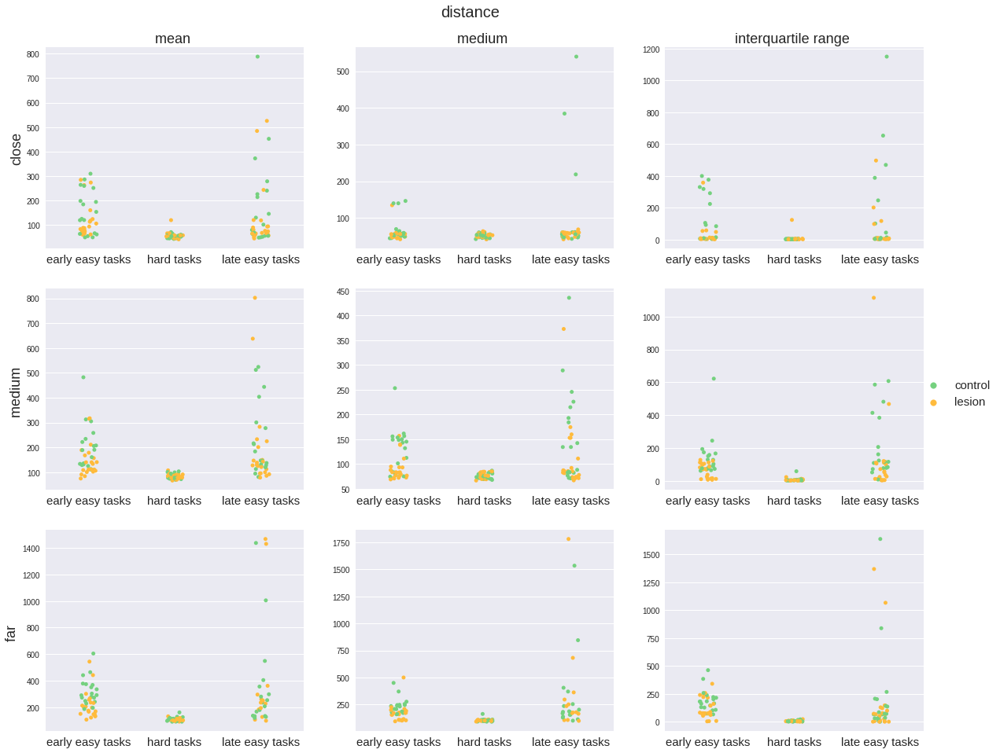

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('distance',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.stripplot("contingency", "mean_dis_10f_st5", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.stripplot("contingency", "median_dis_10f_st5", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.stripplot("contingency", "iqr_dis_10f_st5", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a= axes[2,0].set_ylabel('far ', fontsize=18)

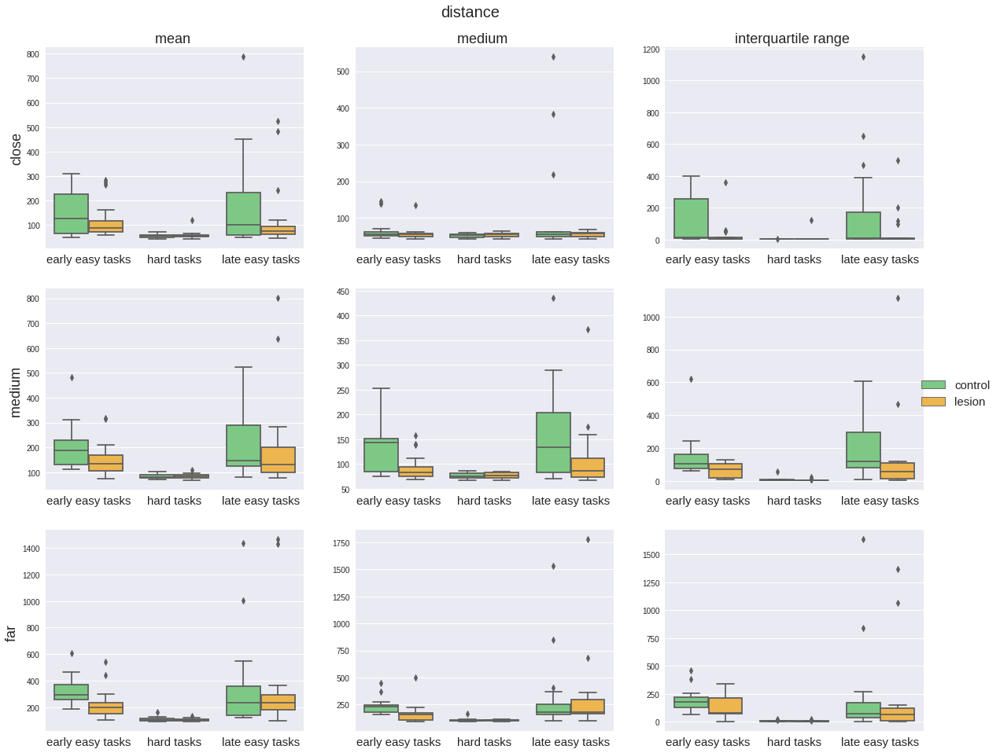

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('distance',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.boxplot("contingency", "mean_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.boxplot("contingency", "median_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.boxplot("contingency", "iqr_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a= axes[2,0].set_ylabel('far ', fontsize=18)

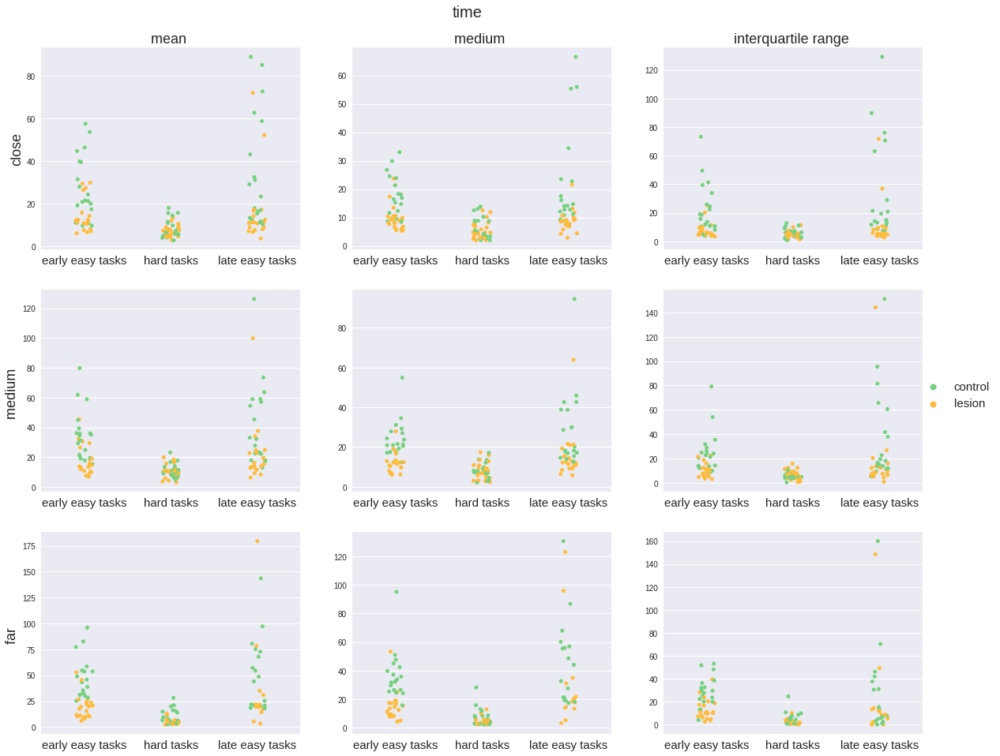

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('time',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.stripplot("contingency", "mean_time", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.stripplot("contingency", "median_time", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.stripplot("contingency", "iqr_time", data=sum_data,hue='animal_operation',
                         marker='o',ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a= axes[2,0].set_ylabel('far ', fontsize=18)

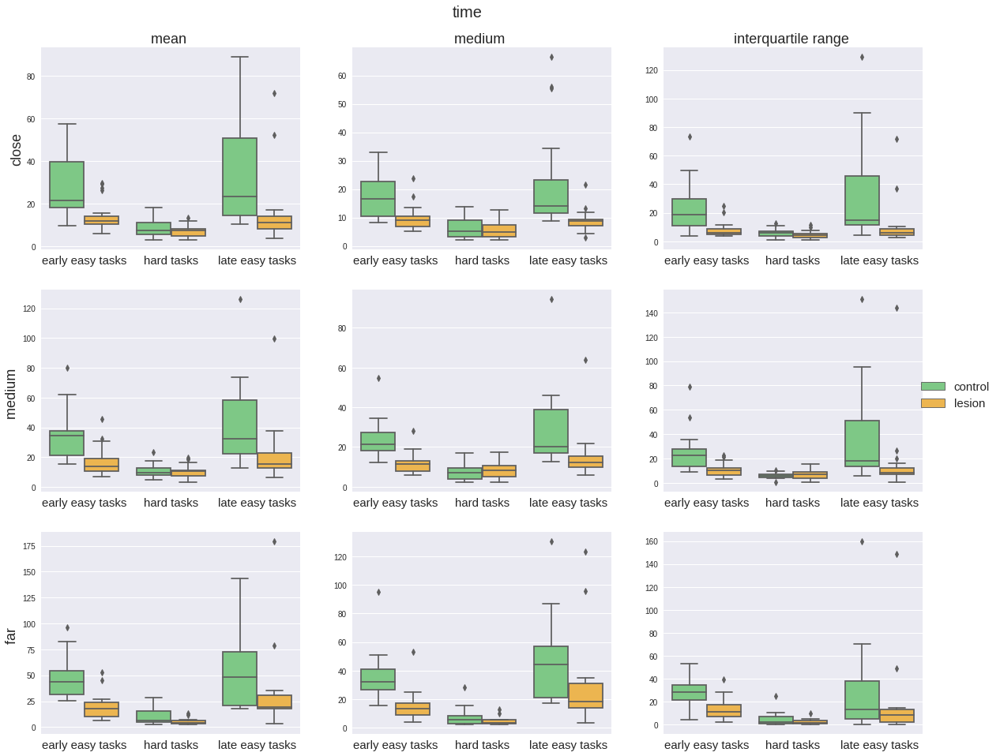

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('time',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_SumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.boxplot("contingency", "mean_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.boxplot("contingency", "median_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.boxplot("contingency", "iqr_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlim(-0.5,2.5)
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy tasks','hard tasks','late easy tasks'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a = axes[2,0].set_ylabel('far ', fontsize=18)

## Multivariate plots for the difference metric

We can see that hippocampus lesion animals did not modulate much of both the distance and time across all three statistics and all three start positions.

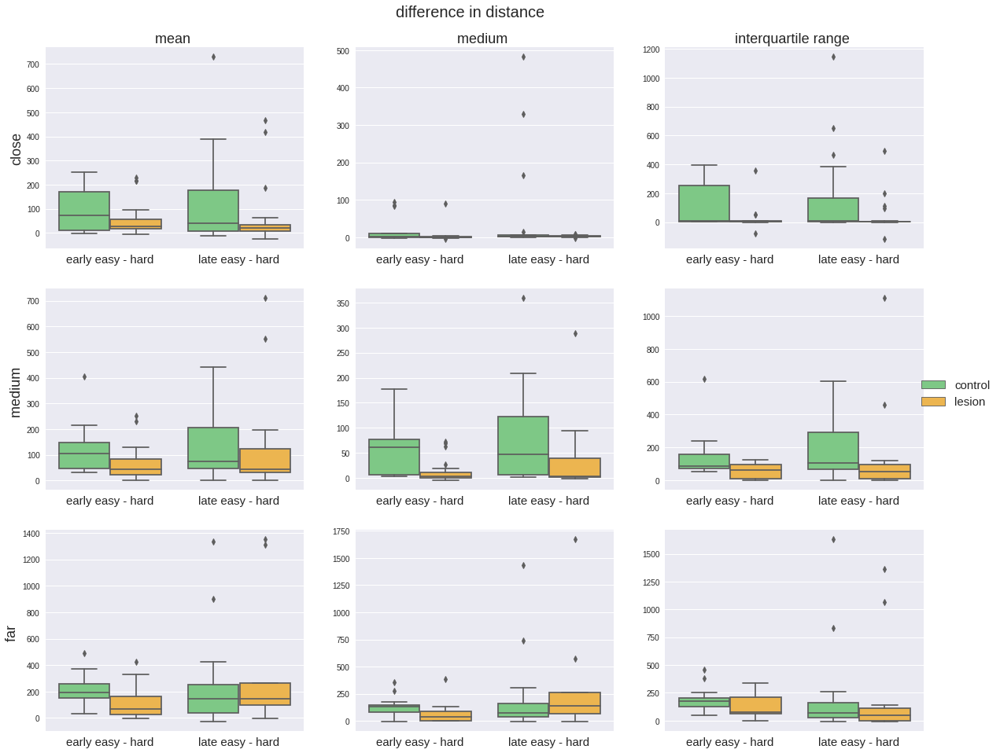

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('difference in distance',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_DiffSumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.boxplot("diff", "mean_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.boxplot("diff", "diff_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.boxplot("diff", "iqr_dis_10f_st5", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a =axes[2,0].set_ylabel('far ', fontsize=18)

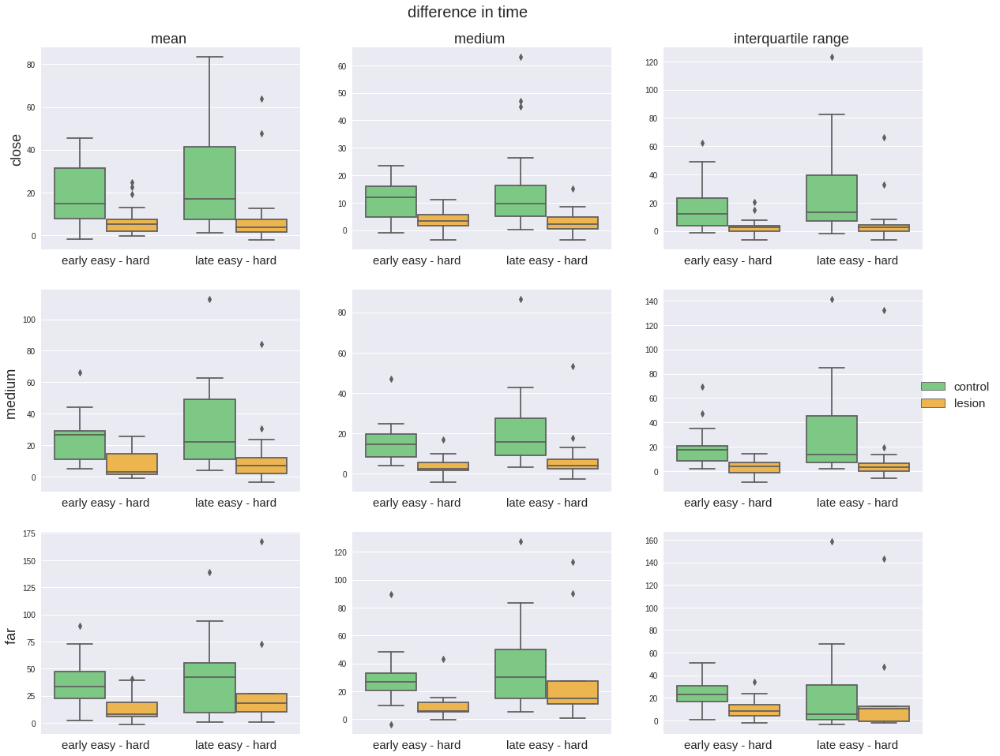

In [ ]:
#@title  {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('difference in time',fontsize=20)
mmi = ['mean','median','iqr']
plt.subplots_adjust(top=0.93)
for row in range(3):
    sum_data = df_DiffSumInfo.query('StartPos_dis == @row')
    axes[row,0]=sns.boxplot("diff", "mean_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,0],palette=My_palette)

    axes[row,1]=sns.boxplot("diff", "diff_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,1],palette=My_palette)

    axes[row,2]=sns.boxplot("diff", "iqr_time", data=sum_data,hue='animal_operation',
                         saturation=0.8,ax=axes[row,2],palette=My_palette)
for row in range(3):
    for col in range(3):
        axes[row,col].set_xlabel('')
        axes[row,col].set_ylabel('')
        axes[row,col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
        axes[row,col].legend_.remove()
axes[2,2].legend(loc='upper right',bbox_to_anchor=(0.8, 1.3, 0.5, 0.5),fontsize=15)
axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
a= axes[2,0].set_ylabel('far ', fontsize=18)

## Statistics on the difference metric between control and lesion animals

We can see that the p values are extremely small for all mesurements of control vs. lesion animals, strongly indicating that control and lesion animals behave very differently after experiencing tasks of different difficulties.

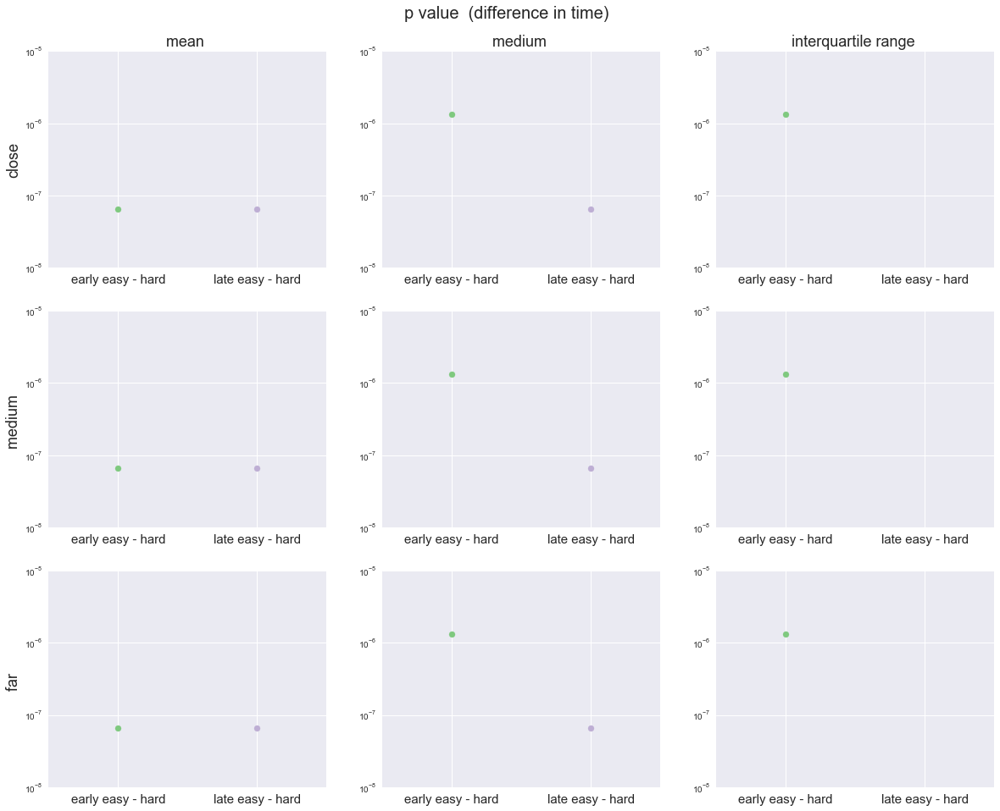

In [ ]:
#@title {display-mode: "form"}
f,axes = plt.subplots(3,3,figsize=(20,15))
f.suptitle('p value  (difference in time)',fontsize=20)
test = ['mean_time','diff_time','iqr_time']
diff_list = ['BN','AN']
df = df_DiffSumInfo
p_list = []
plt.subplots_adjust(top=0.93)
for col in range(3):
    for row in range(3):
        for diff in range(len(diff_list)):
            item_list_con = []
            for animal in control_animal:
                item = df.loc[(df['animal_ID']== animal) & (df['StartPos_dis']== dis)
                                            & (df['diff']==diff_list[diff]),
                                            test[col]].values[0]
                item_list_con.append(item)
            item_list_le = []
            for animal in lesion_animal:
                item = df.loc[df['animal_ID']== animal & (df['StartPos_dis']== dis)
                                            & (df['diff']==diff_list[diff])
                                            ,test[col]].values[0]
                item_list_le.append(item)
            p_item = ranksum(item_list_con,item_list_le)
            axes[row,col].scatter([diff],[p_item[1]])
            axes[row,col].set_yscale('log')
            axes[row,col].axhline(y=0.05,c='red')
            axes[row,col].set_xlabel('')
            axes[row,col].set_ylabel('')
            axes[row,col].set_xlim(-0.5,1.5)
            axes[row,col].set_ylim(1/100000000,1/100000)
            axes[row,col].set_xticks([0,1])
            axes[row,col].set_xticklabels(['early easy - hard','late easy - hard'],fontsize=15)
            p_list.append(p_item)

axes[0,0].set_title('mean ', fontsize=18)
axes[0,1].set_title('medium ', fontsize=18)
axes[0,2].set_title('interquartile range ', fontsize=18)
axes[0,0].set_ylabel('close', fontsize=18)
axes[1,0].set_ylabel('medium ', fontsize=18)
axes[2,0].set_ylabel('far ', fontsize=18)
hide_toggle()